# Kidney

In [1]:
import os
import phlower
import numpy as np
import pandas as pd
import networkx as nx
from itertools import chain
import scipy
import pickle
import sklearn
import pydot
import scanpy as sc
import seaborn as sns
import colorcet as cc
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
from datetime import datetime
from collections import Counter
import networkx as nx

In [2]:
import phlower
phlower.__version__

'0.1.3'

In [3]:
knn_k = 6
ndc_n = 40
s_n = 4

In [4]:
import logging

if not os.path.exists("logs"):
    os.mkdir("logs")
logger = logging.getLogger()
fhandler = logging.FileHandler(filename=f'logs/i_{knn_k}_{datetime.now()}.log'.replace(" ", "_"), mode='a')
formatter = logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s')
fhandler.setFormatter(formatter)
logger.addHandler(fhandler)
logger.setLevel(logging.DEBUG)

logger.info(f'begining: {datetime.now()}')

### load kidney anndata with MOJITOO reduction and clustering.

In [5]:
adata = phlower.dataset.kidney()

In [6]:
dt1 = datetime.now()
print('ddhodge Datetime Start:', dt1)
logger.info(f'ddhodge Datetime Start: {dt1}')

phlower.ext.ddhodge(adata, basis='X_pca', npc=30, roots=adata.obs['group']==6, k=knn_k, ndc=ndc_n,s=s_n)

dt2 = datetime.now()

print('ddhodge Datetime End:', dt2)
logger.info(f'ddhodge Datetime End: {dt2}')
delta = dt2 - dt1

print('ddhodge Difference is:', delta)
logger.info(f'ddhodge Difference is: {delta}')

ddhodge Datetime Start: 2024-09-29 18:28:09.553560
2024-09-29 18:28:09.557446 distance_matrix
2024-09-29 18:28:50.421441 Diffusionmaps: 
done.
2024-09-29 18:31:14.670074 diffusion distance:
2024-09-29 18:31:38.995999 transition matrix:
2024-09-29 18:32:41.495777 graph from A
2024-09-29 18:32:47.660425 Rewiring: 
2024-09-29 18:32:47.660522 div(g_o)...
2024-09-29 18:37:17.269293 edge weight...
2024-09-29 18:37:18.744480 cholesky solve ax=b...
+ 1e-06 I is positive-definite
2024-09-29 18:37:23.942825 grad...
2024-09-29 18:43:41.807040 potential.
2024-09-29 18:50:44.198517 ddhodge done.
done.
2024-09-29 18:50:45.650726 calculate layouts
2024-09-29 19:08:55.358329 done
ddhodge Datetime End: 2024-09-29 19:08:55.358683
ddhodge Difference is: 0:40:45.805123


### show the pseudotime on the neato layout

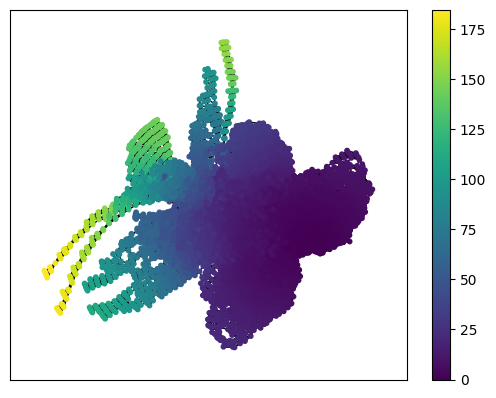

In [7]:
phlower.pl.nxdraw_score(adata, color='u',node_size=10)

### show the clusters

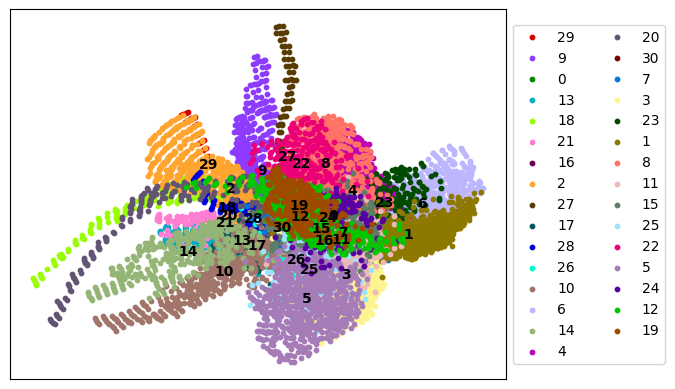

In [8]:
_, ax = plt.subplots(1,1, )
phlower.pl.nxdraw_group(adata,node_size=10, show_edges=False, ax=ax, legend_col=2)
ax.legend(ncol=2, markerscale=1, loc="center left", bbox_to_anchor=(1, 0.5))

### show the days

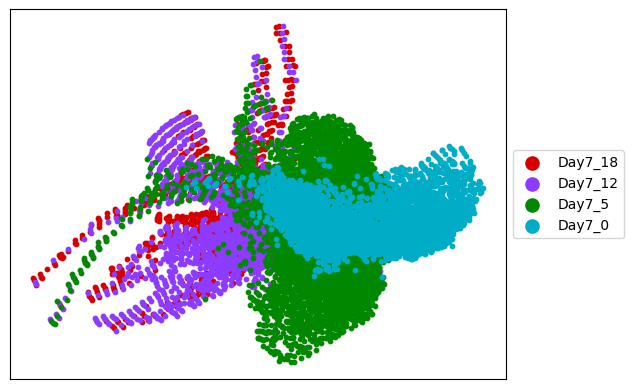

In [9]:
dic =  {"S1":"Day7_18", "S2":"Day7_12", "S3":"Day7_5", "S4":"Day7_0"}
adata.obs['time'] = [dic[i] for i in adata.obs['sample']]
phlower.pl.nxdraw_group(adata,node_size=10, group_name='time',show_edges=False, show_legend=True, legend_col=1, markerscale=3, label=False)

### connect start state cells and terminal state cells

In [10]:
phlower.tl.construct_delaunay(adata, trunc_quantile = 0.9, trunc_times = 3, start_n=10, end_n=10, separate_ends_triangle=True, circle_quant=0.1, calc_layout=False)

start clusters  [0, 1, 3, 4, 5, 6, 7, 8, 11, 12, 13, 15, 16, 19, 21, 23, 24, 25, 28]
end clusters  [2, 9, 10, 12, 13, 14, 18, 20, 21, 27, 29]


### Perform hodge laplacian decomposition

In [11]:
from datetime import datetime

dt1 = datetime.now()
print('L1 Datetime Start:', dt1)
logging.info(f'L1 Datetime Start: {dt1}')

phlower.tl.L1Norm_decomp(adata, L1_mode='sym', isnorm = True)
dt2 = datetime.now()
print('L1 Datetime End:', dt2)
logger.info(f'L1 Datetime End: {dt2}')
delta = dt2 - dt1
print('L1 Difference is:', delta)
logger.info(f'L1 Difference: {delta}')

L1 Datetime Start: 2024-09-29 19:09:01.098998
29.895473957061768  sec
L1 Datetime End: 2024-09-29 19:09:31.975115
L1 Difference is: 0:00:30.876117


### check the number of harmonics

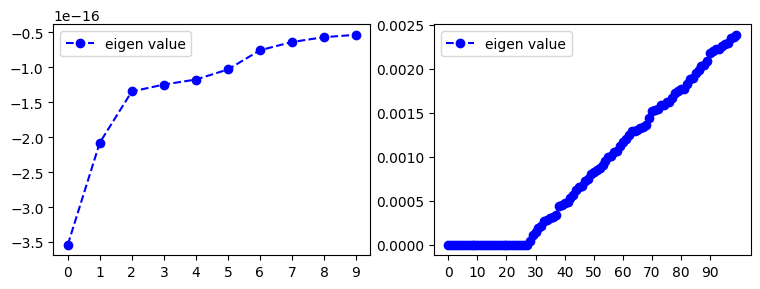

In [12]:
_, ax = plt.subplots(1,2, figsize=(9,3))
phlower.pl.plot_eigen_line(adata, n_eig=10,ax=ax[0])
phlower.pl.plot_eigen_line(adata, n_eig=100, step_size=10, ax=ax[1])

In [13]:
phlower.tl.knee_eigen(adata)

knee eigen value is  28


### preference random walk to sample trajectories

In [14]:
phlower.tl.random_climb_knn(adata, n=10000)

100%|██████████| 10000/10000 [00:33<00:00, 300.71it/s]


### display 2 sampled trjaectoris 

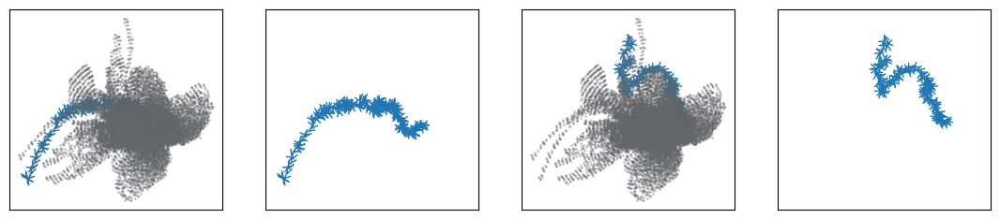

In [15]:
from scipy import constants
fig_width = 9
fig, axs = plt.subplots(1, 4,figsize=(fig_width*1.5, fig_width*0.5 / constants.golden))
phlower.pl.plot_traj(adata, trajectory=adata.uns['knn_trajs'][0], colorid=0, node_size=1, ax=axs[0])
phlower.pl.plot_traj(adata, trajectory=adata.uns['knn_trajs'][0], colorid=0, node_size=0, ax=axs[1])
phlower.pl.plot_traj(adata,  trajectory=adata.uns['knn_trajs'][1], colorid=0, node_size=1, ax=axs[2])
phlower.pl.plot_traj(adata,  trajectory=adata.uns['knn_trajs'][1], colorid=0, node_size=0, ax=axs[3])

### project trajectories to harmonic space

In [16]:
phlower.tl.trajs_matrix(adata)

2024-09-29 19:12:53.166895 projecting trajectories to simplics...
2024-09-29 19:13:14.491851 Embedding trajectory harmonics...
eigen_n < 1, use knee_eigen to find the number of eigen vectors to use: 28


/home/sz753404/miniconda3/envs/R422/lib/python3.10/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


2024-09-29 19:13:54.220696 done.


### clustering trajectory paths in t-map space

In [17]:
phlower.tl.trajs_clustering(adata, eps=0.5, oname_basis='')

### clean bad clusters 

In [18]:
phlower.tl.select_trajectory_clusters(adata, manual_rm_clusters=[2], verbose=False)
phlower.tl.unique_trajectory_clusters(adata, group_name='group', verbose=False)

### show trajectory clusters in umap (derived from t-map space)

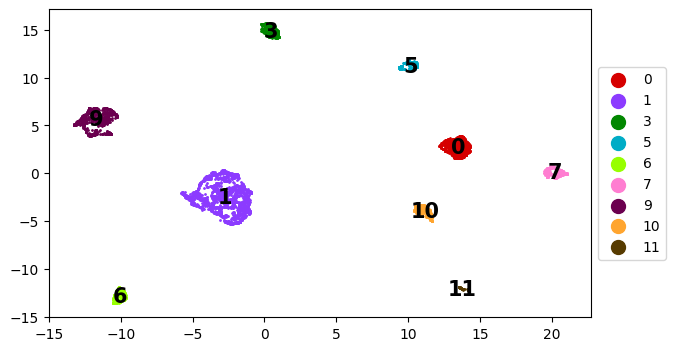

In [19]:
_, ax = plt.subplots(1,1, figsize=(7, 4))
phlower.pl.plot_trajs_embedding(adata, clusters="trajs_clusters", ax=ax)

### show sampled trajectory paths in neato layout space

z_min, z_max 1.7272154769335022e-08 3.0619701760704366e-06


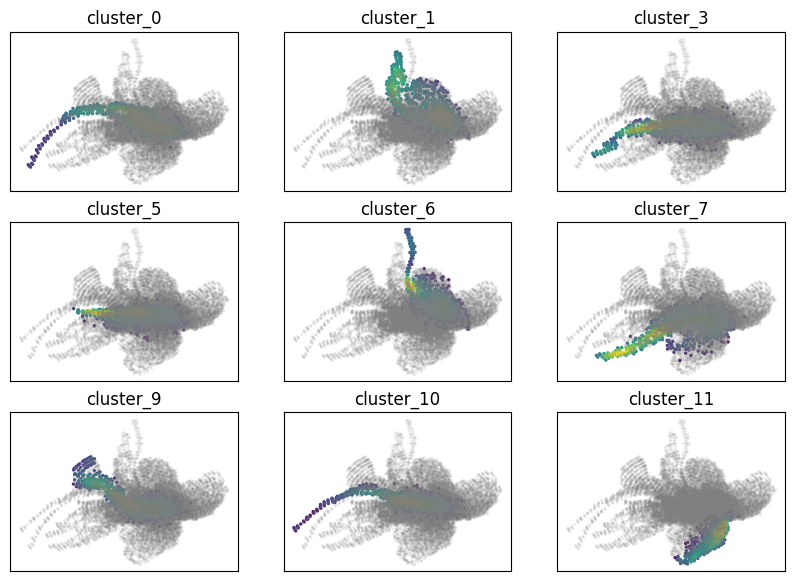

In [20]:
fig, ax = phlower.pl.plot_density_grid(adata,  figsize=(10, 7), cluster_name='trajs_clusters', bg_alpha=0.1, return_fig=True, sample_n=1000)

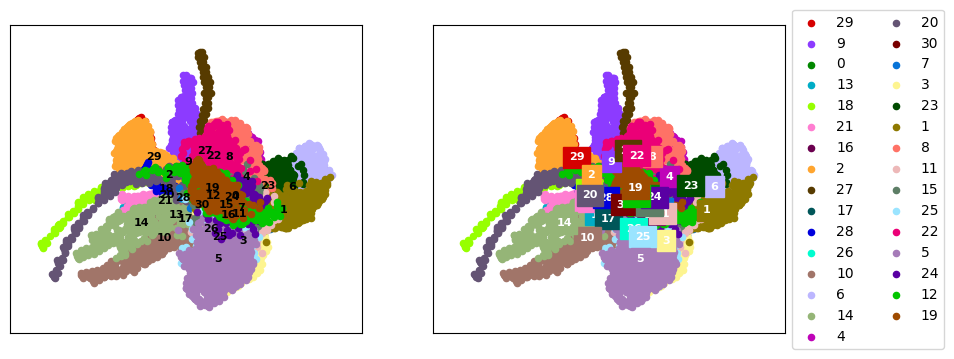

In [21]:
fig, ax = plt.subplots(1,2, figsize=(10,4))
phlower.pl.nxdraw_group(adata, node_size=20, show_edges=True, ax=ax[0], show_legend=False, labelstyle='text', labelsize=8)
phlower.pl.nxdraw_group(adata, node_size=20, show_edges=True, ax=ax[1], show_legend=True, labelstyle='box', labelsize=8, legend_col=2)

### annotate the branches

In [22]:
anno_dic = {
    0:  "Neuron-2",
    1:  "Tubular",
    3:  "Stromal-3",
    5:  "Stromal-4",
    6:  "Podocytes",
    7:  "Stromal-2",
    9:  "Muscle",
    11: "Stromal-1",
    10: "Neuron-1",
}
adata.uns['annotation']= [anno_dic.get(int(i), i) for i in adata.uns['trajs_clusters']]

### create stream tree

In [23]:
phlower.tl.harmonic_stream_tree(adata, 
                                trajs_clusters='annotation', 
                                retain_clusters=list(set(anno_dic.values())),  
                                min_bin_number=20,
                                cut_threshold=1.5, 
                                verbose=True)

2024-09-29 19:14:04.776740 trajectory groups ranking...
eigen_n < 1, use knee_eigen to find the number of eigen vectors to use
eigen_n: 28
['Neuron-1', 'Tubular', 'Podocytes', 'Muscle', 'Stromal-2', 'Neuron-2', 'Stromal-4', 'Stromal-3', 'Stromal-1']


traj bins: 100%|██████████| 9/9 [00:30<00:00,  3.41s/it]


2024-09-29 19:14:51.156594 sync bins to by pseudo time...
2024-09-29 19:14:53.315156 calculating distances between bin pairs...
2024-09-29 19:14:58.197484 fate tree creating...
[('Podocytes', 'Tubular'), ('Neuron-1', 'Muscle', 'Neuron-2'), ('Stromal-3', 'Stromal-2', 'Stromal-1', 'Stromal-4')]
2024-09-29 19:14:58.199676 tree attributes adding...


/home/sz753404/miniconda3/envs/R422/lib/python3.10/site-packages/phlower/tools/harmonic_pseudo_tree.py:697: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  roots = np.array(htree_roots)


2024-09-29 19:15:00.960068 plugin to STREAM...
2024-09-29 19:15:00.964338 projecting trajs to harmonic...
2024-09-29 19:15:29.490440 cumsum...
2024-09-29 19:15:30.186386 edge cumsum dict...


edges projection: 100%|██████████| 5105/5105 [00:09<00:00, 553.55it/s]


2024-09-29 19:15:42.025383 done...
there are 967 nodes not visited in the tree
will approximate the node cumsum coordinate by 5 nearest accessible neighbors
2024-09-29 19:17:45.660848 done...


In [24]:
adata.uns['workdir'] = ''
adata.obs['group_str'] = [str(i) for i in adata.obs['group']]

### plot stream tree

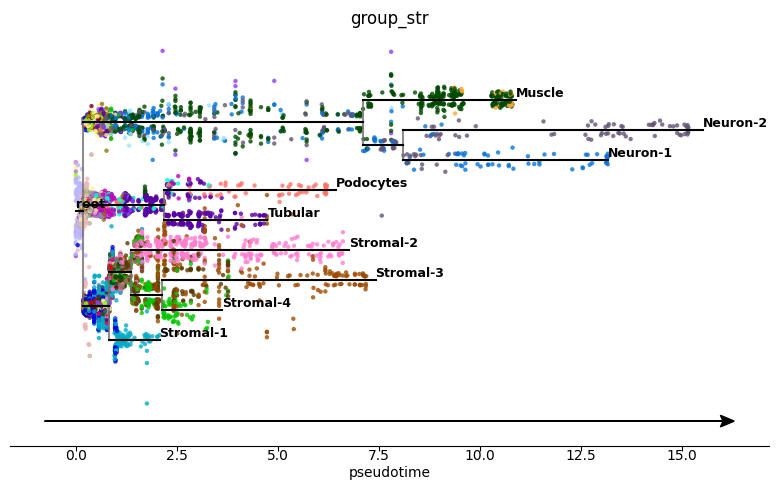

In [25]:
phlower.ext.plot_stream_sc(adata, fig_size=(8,5), color=['group_str'],show_legend=False, dist_scale=1,s=10)

### show trajectory paths in umap and in ct-map space

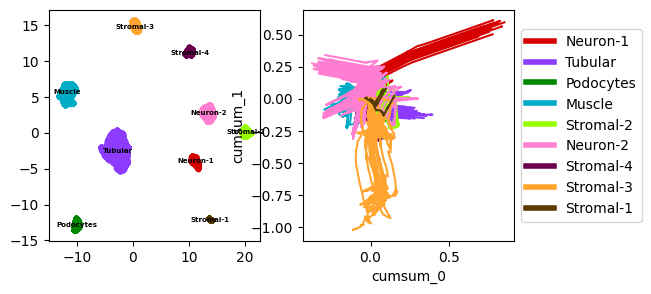

In [26]:
figs = []
fig, ax = plt.subplots(1,2, figsize=(6,3))
phlower.pl.plot_trajs_embedding(adata, clusters="annotation",show_legend=False, labelsize=5, node_size=10, ax=ax[0])
phlower.pl.plot_trajectory_harmonic_lines(adata, clusters="annotation", sample_ratio=0.05, show_legend=True, ax=ax[1])

### show trajctory paths in t-map space

3


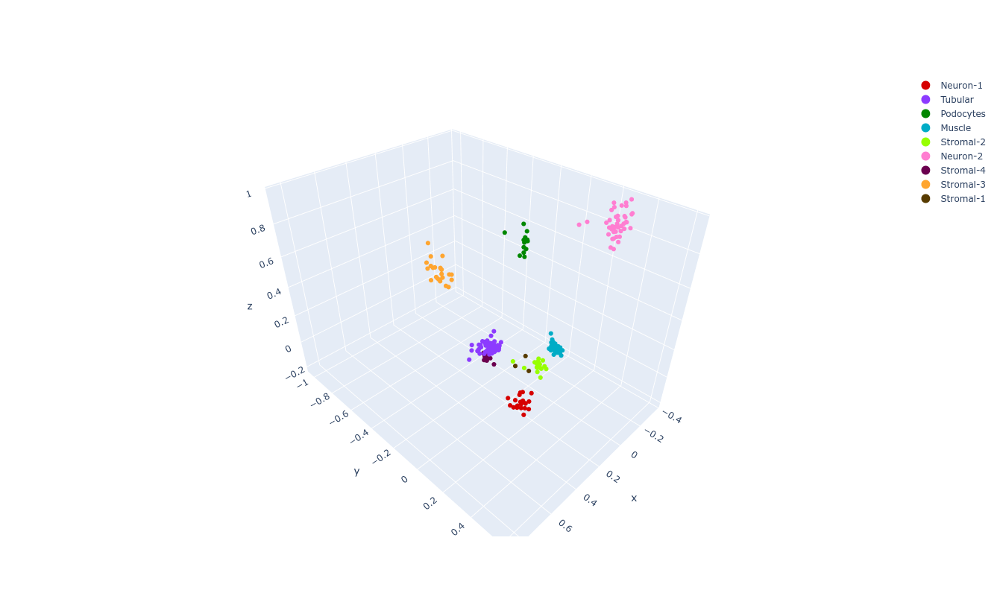

In [27]:
phlower.pl.plot_trajectory_harmonic_points_3d(adata, clusters="annotation", sample_ratio=.05, show_legend=True, fig_path=None)

### show trajctory paths in ct-map space

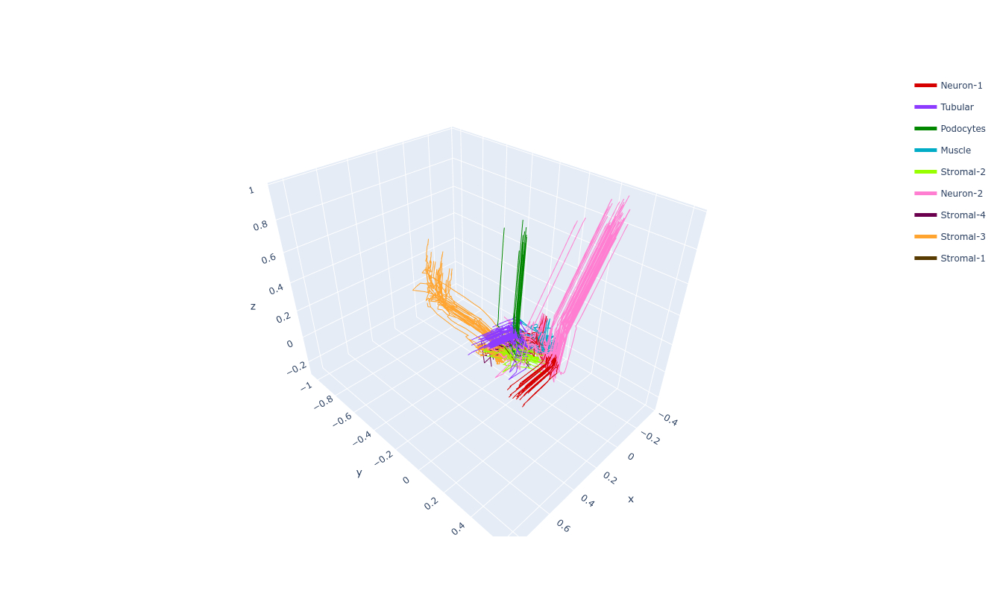

In [28]:
phlower.pl.plot_trajectory_harmonic_lines_3d(adata, clusters="annotation", sample_ratio=.05, show_legend=True, fig_path=None)

### save adata with networkx object using pickle

In [29]:
import pickle
import os
from datetime import date

if not os.path.exists("save"):
    os.mkdir('save')

today_ = date.today().strftime("%Y-%m-%d")
pickle.dump(adata, open(f"save/kidney_{today_}.pickle", 'wb'))

### show session info

In [30]:
import session_info
session_info.show()